<a href="https://colab.research.google.com/github/AbigailMRod/CV_edX/blob/main/PillowLibrary.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Pillow library (PIL)**

Una imagen digital es un archivo en la computadora. En esta práctica se comprenderán los archivos y se aprenderá a trabajar con ellos con la librería Pillow



---





## Clonamos el repositorio para obtener los archivos

In [1]:
!git clone https://github.com/AbigailMRod/CV_edX.git

Cloning into 'CV_edX'...
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 9 (delta 1), reused 5 (delta 0), pack-reused 0
Unpacking objects: 100% (9/9), done.


## Damos acceso al Drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Imágenes y rutas
Una imagen se almacena como un archivo en la computadora, a continuación se define my_image como el nombre del archivo en este directorio.

In [3]:
my_image="/content/CV_edX/ProcessingOpenCV_Pillow/lenna.jpg"

Los archivos de imagen se almacenan en el sistema de archivos de su computadora. Su ubicación se especifica mediante una "ruta", que a menudo es única. Puede encontrar la ruta de su directorio de trabajo actual con el módulo os de Python. El módulo os proporciona funciones para interactuar con el sistema de archivos, p. crear o eliminar un directorio (carpeta), enumerar su contenido, cambiar e identificar el directorio de trabajo actual.

In [5]:
import os
cwd = os.getcwd()
cwd

'/content'

La ruta a una imagen se puede encontrar usando la siguiente línea de código

In [6]:
image_path = os.path.join(cwd, my_image)
image_path

'/content/CV_edX/ProcessingOpenCV_Pillow/lenna.jpg'

## **Cargar imágenes en Python**



---



La biblioteca Pillow (PIL) es una biblioteca popular para cargar imágenes en Python. Además, muchas otras bibliotecas como "Keras" y "PyTorch" utilizan esta biblioteca para trabajar con imágenes. El módulo `Image` proporciona funciones para cargar y guardar imágenes en el sistema de archivos. Vamos a importarlo desde `PIL`.

In [8]:
from PIL import Image 

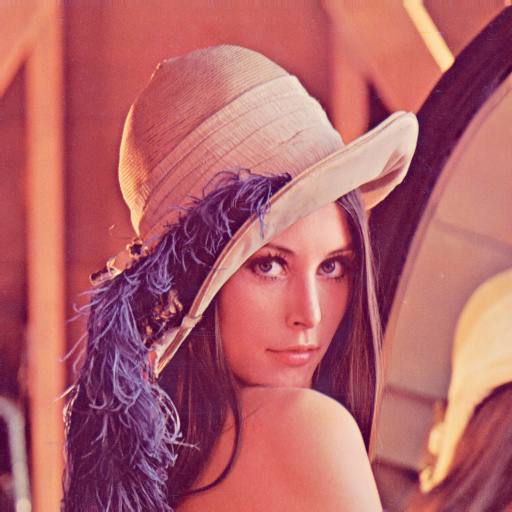

In [10]:
image = Image.open(my_image)
type(image)
image

## Trazar una imagen
También podemos usar el método `show` de `PIL` para mostrara la imagen, este método puede funcionar o no dependiendo de la comfiguración.

In [11]:
image.show()

También puede usarse el método `imshow` de la libreria `matplotlib` para mostrar la imagen

In [12]:
import matplotlib.pyplot as plt

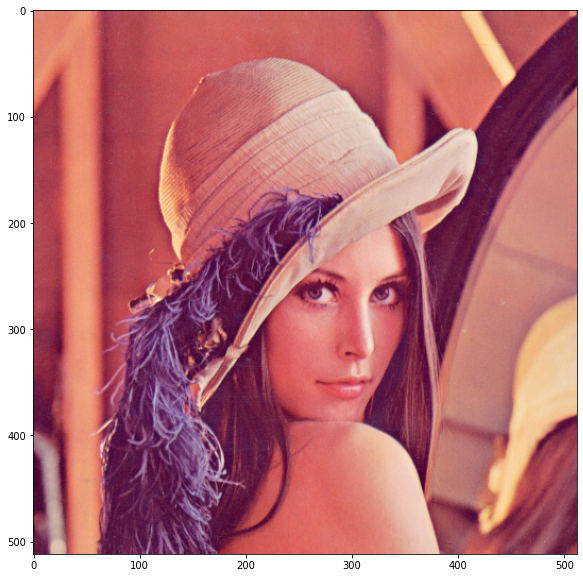

In [14]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

También se puede cargar la imagen utilizando la ruta completa, esto es útil cuando la imagen no está en el direcrtorio de trabajo

In [15]:
image = Image.open(image_path)

Podemos también utilizar los atributos del objeto paa obtener información.
El atributo `format` es la extensión o formato de la imagen.

El atributo `size` devuelve una tupla, el primer elemento es el número de pixeles del ancho y el segundo es en número de pixeles que componene el alto de la imagen

Con el atributo mode espeficica el formato de pixel utilizado (RGB es un espacio de color donde el rojo verde y azul se suman para producri colores)

In [16]:
print(image.size)

(512, 512)


In [17]:
print(image.format)

JPEG


In [18]:
print(image.mode)

RGB


El método `Image.open` no carga los datos de las imágenes en la memoria de la computadora. Carga el objeto de `PIL` lee el contenido del archivo, lo decodifica y expande la imagen 

In [19]:
im = image.load()

Podemos también guardar la imagen en formato jpg usando el siguiente comando

In [22]:
image.save("lenna.jpg")

## Imágenes en escala de grises, cuantización y canales de color

---



### Imágenes en escala de grises
El módulo ImageOps contiene varias operaciones de procesamiento de imágenes.


In [23]:
from PIL import ImageOps

Las imágenes en escala de grises tienen valores de píxel que representan la cantidad de luz o la intensidad de ese píxel. Los tonos claros de gris tienen una intensidad alta mientras que los tonos más oscuros tienen una intensidad más baja, es decir, el blanco tiene la intensidad más alta y el negro la más baja.

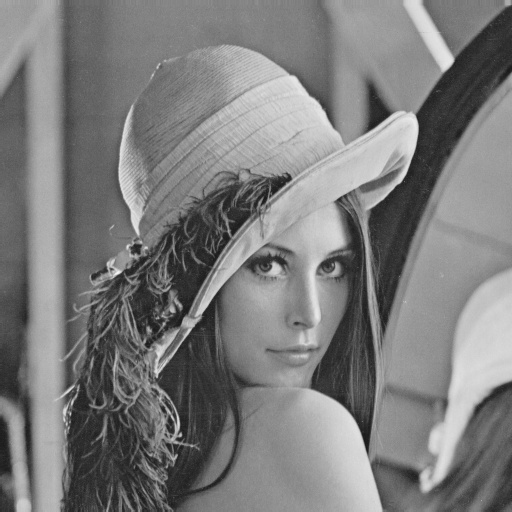

In [24]:
image_gray = ImageOps.grayscale(image)
image_gray

El modo "L" es para escala de grises


In [25]:
image_gray.mode

'L'

##Cuantificación
La cuantificación de una imagen es el número de valores de intensidad únicos que puede tomar cualquier píxel de la imagen. Para una imagen en escala de grises, esto significa el número de diferentes tonos de gris. La mayoría de las imágenes tienen 256 niveles diferentes. Puede disminuir los niveles utilizando el método de cuantización.

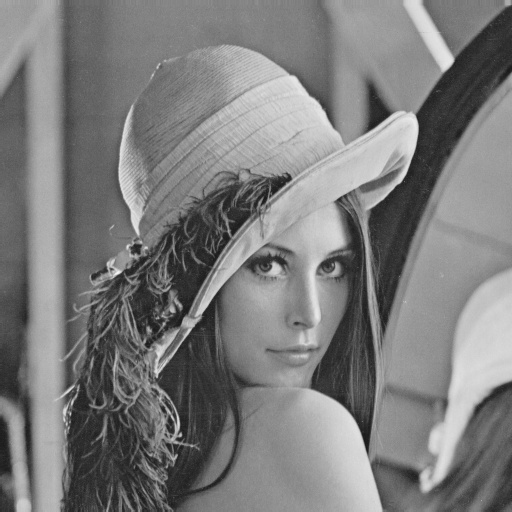

In [27]:
image_gray.quantize(256//2)
image_gray

Si seguimos dividiendo el número de valores por 2 y comparamos con la imagen original

In [30]:
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst

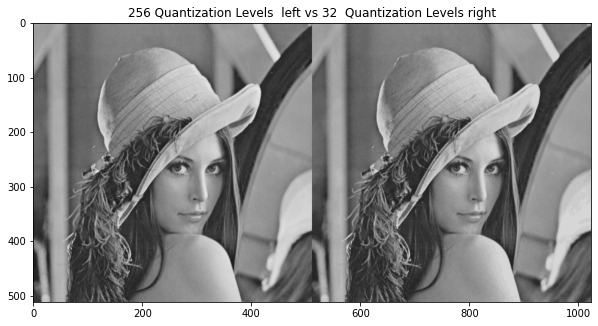

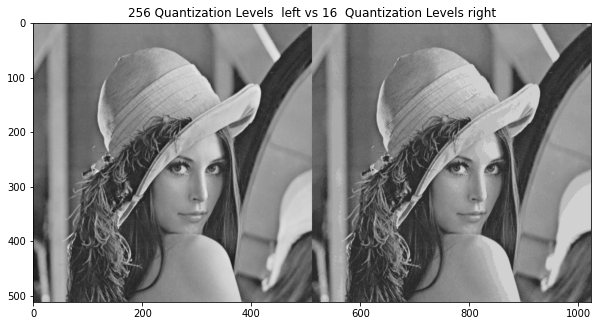

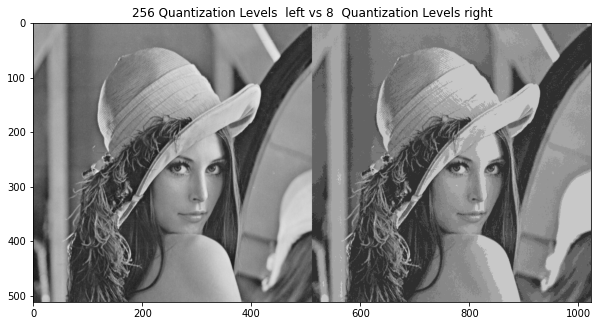

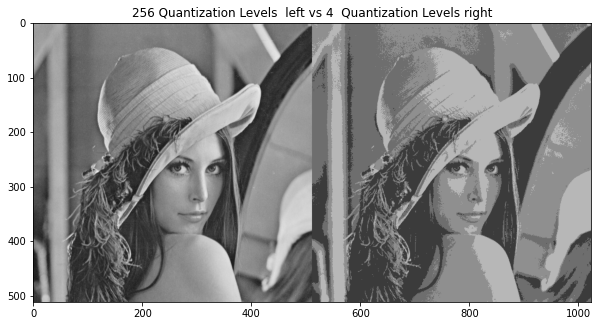

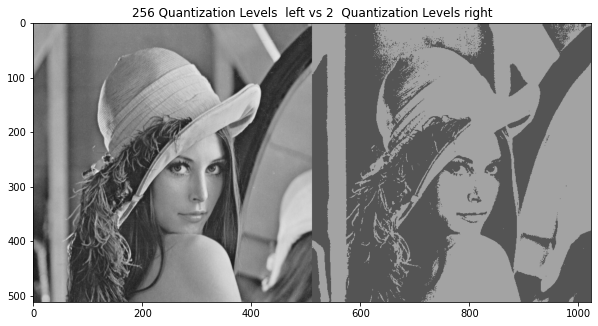

In [31]:
#get_concat_h(image_gray,  image_gray.quantize(256//2)).show(title="Lena") 
for n in range(3,8):
    plt.figure(figsize=(10,10))

    plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n))) 
    plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n))
    plt.show()

##Canales de color
También se puede trabajar con diferentes canales de colores 

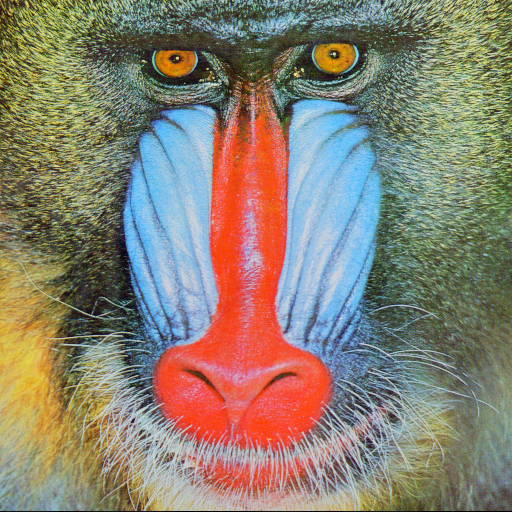

In [33]:
baboon = Image.open("/content/CV_edX/ProcessingOpenCV_Pillow/baboon.png")
baboon

In [35]:
red, green, blue = baboon.split()

Al trazar la imagen en color junto al canal rojo en escala de grises, vemos que las regiones con rojo tienen valores de intensidad más altos.

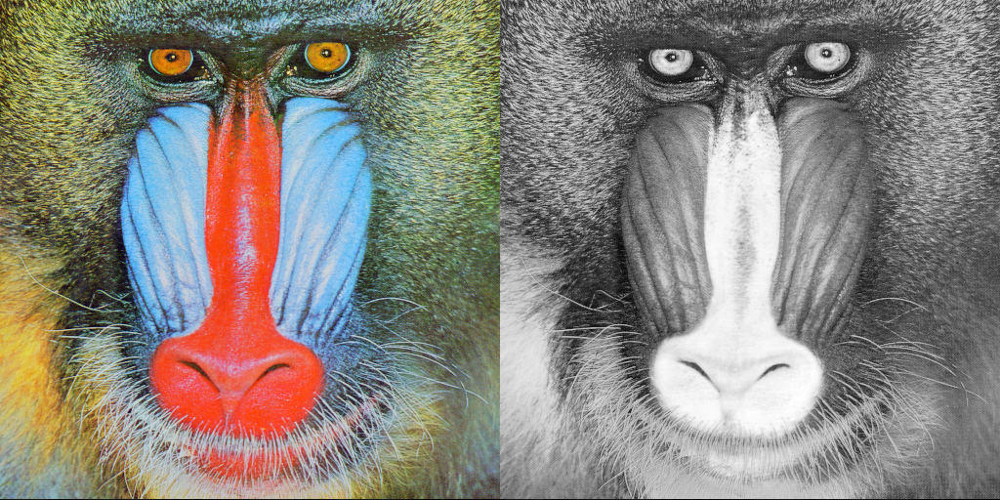

In [36]:
get_concat_h(baboon, red)

Lo mismo para los colores azul y verde

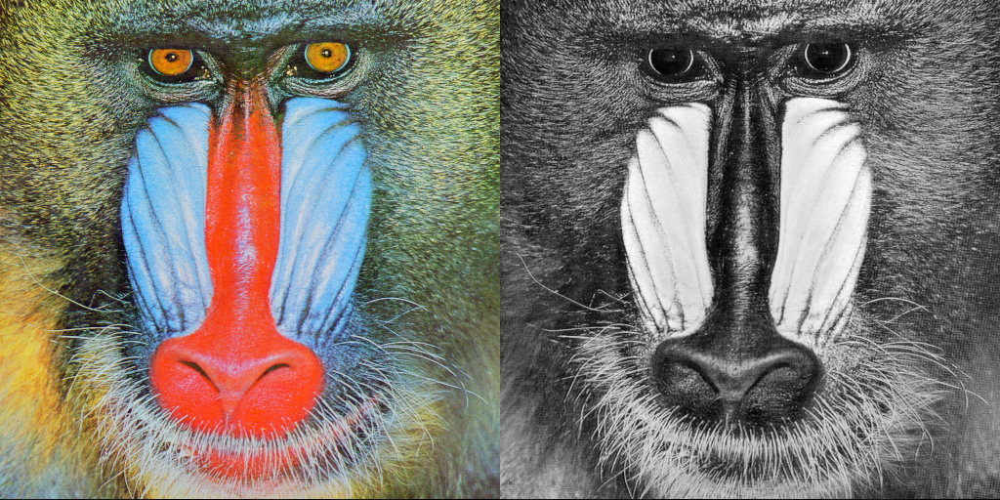

In [38]:
get_concat_h(baboon, blue)

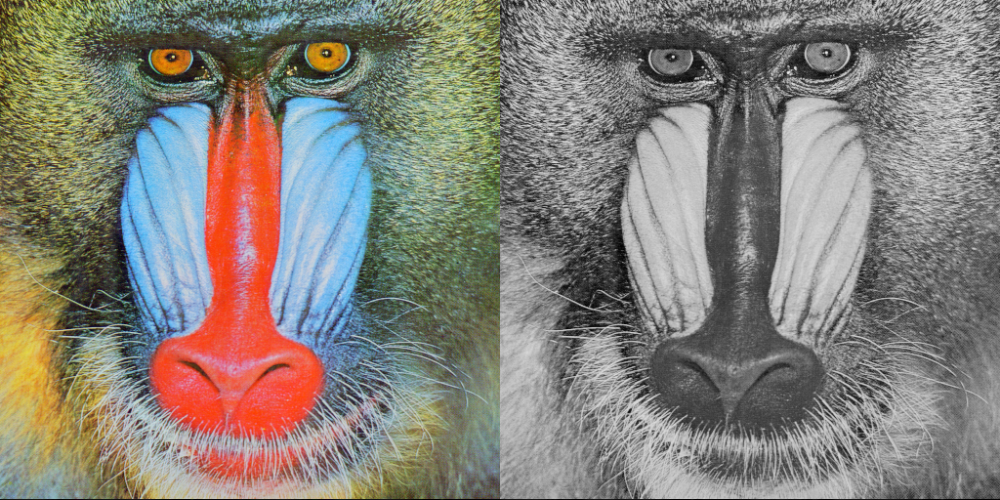

In [39]:
get_concat_h(baboon, green)

##Imágenes `PIL` en matrices de `NumPy`
NumPy es una biblioteca para Python que le permite trabajar con arreglos y matrices multidimensionales. Podemos convertir una imagen PIL en una matriz NumPy. Usamos `asarray()` o la función `array` de NumPy para convertir imágenes PIL en matrices NumPy.

In [40]:
import numpy as np

In [41]:
array = np.asarray(image)
print(type(array))

<class 'numpy.ndarray'>


`np.asarray` convierte la imagen original en una matriz numpy. A menudo, no queremos manipular la imagen directamente, sino crear una copia de la imagen para manipular. El método `np.array` crea una nueva copia de la imagen, de modo que la original permanecerá sin modificar.

In [42]:
array = np.array(image)

El atributo `shape` de un objeto `numpy.array` devuelve una tupla correspondiente a las dimensiones del mismo, el primer elemento da el número de filas o la altura de la imagen, el segundo elemento es el número de columnas o el ancho de la imagen. El elemento final es el número de canales de color.
Se puede interpretar como filas, columnas y colores, cada elemento en el eje del color corresponde al formato de valores RGB

In [43]:
print(array.shape)

(512, 512, 3)


##Indexación
SE puede trazar la imagen como una matriz

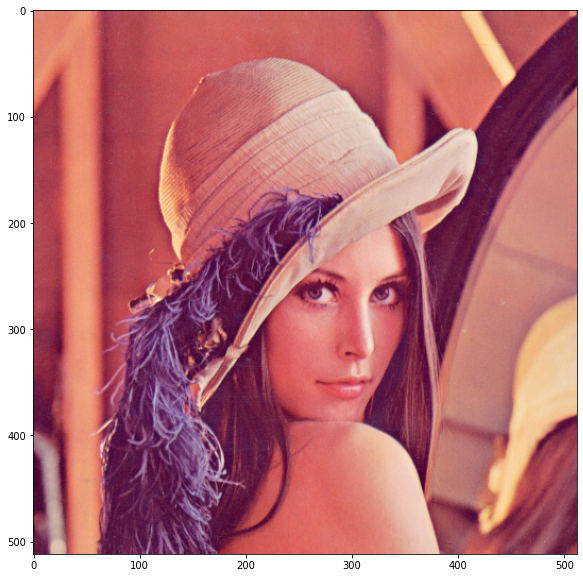

In [44]:
plt.figure(figsize=(10,10))
plt.imshow(array)
plt.show()

Podemos utilizar numpy slicing para devolver las primeras 256 filas correspondientes a la mitad superior de la imagen.

O las 256 primeras columnas

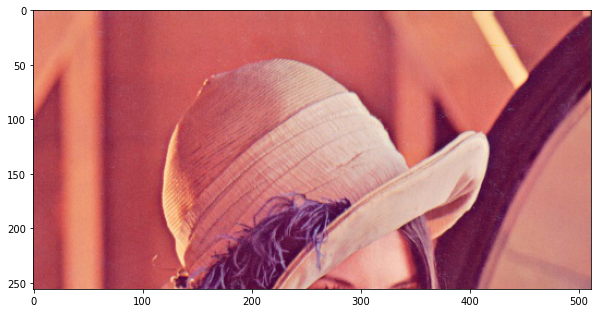

In [46]:
rows =256
plt.figure(figsize=(10,10))
plt.imshow(array[0:rows, : , :])
plt.show()

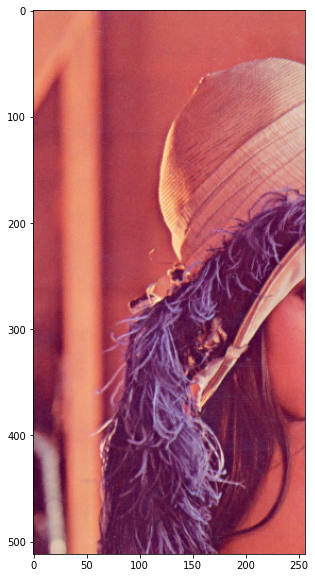

In [47]:
columns =256
plt.figure(figsize=(10,10))
plt.imshow(array[:, 0:columns , :])
plt.show()

También podemos trabajar con los canales de colores

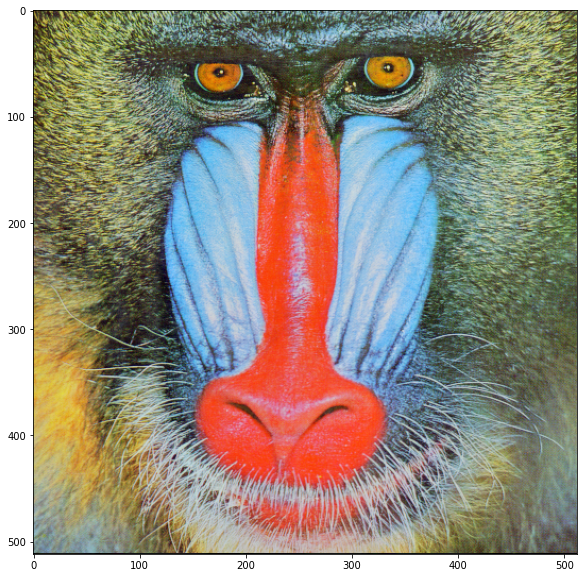

In [48]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array)
plt.show()

Podemos trazar el color rojo como valores de intensidad del color rojo

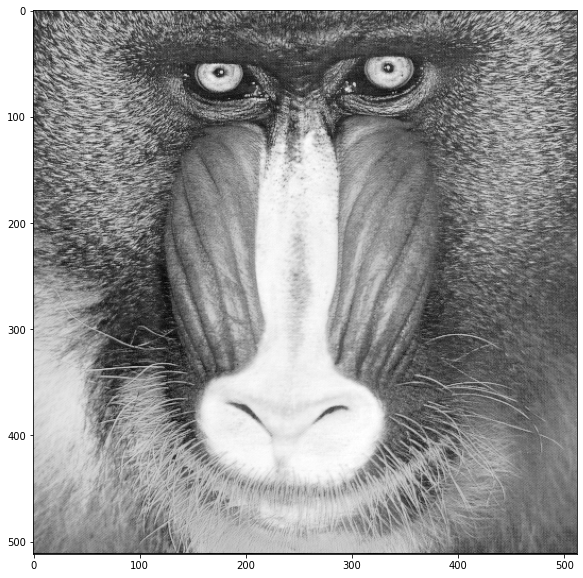

In [51]:
baboon_array = np.array(baboon)
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0], cmap='gray')
plt.show()

o se puede crear una nueva matriz y establecer todos menos los canales de color rojo en cero. Por lo tanto al mostrar la imagen, esta aparecerá en rojo.

Rojo[0]
Verde[1]
Azul[2]

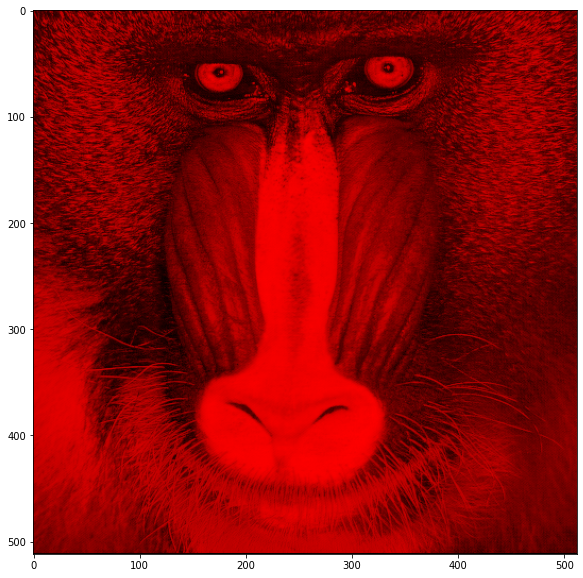

In [52]:
baboon_red=baboon_array.copy()
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_red)
plt.show() 

Lo mismo para el azul

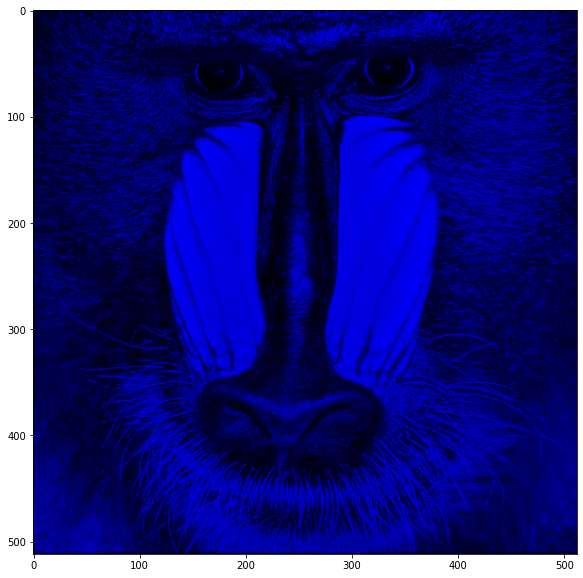

In [53]:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

Y para el verde

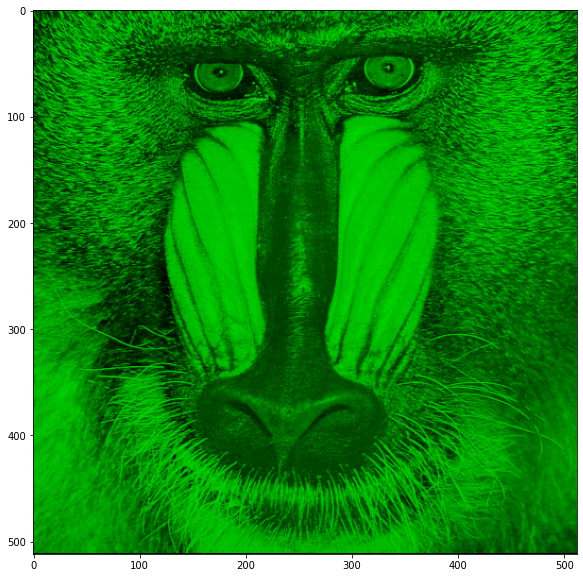

In [54]:
baboon_blue=baboon_array.copy()
baboon_blue[:,:,0] = 0
baboon_blue[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

Ejercicio:
COn alguna imagen


*   Abrir la imagen y crear un objeto PIL llamado blue_imagen
*   Convertir la imagen a una matriz numpy que se pueda manipular llamada blue_array
*   Sacar el canal azul y trazar la imagen



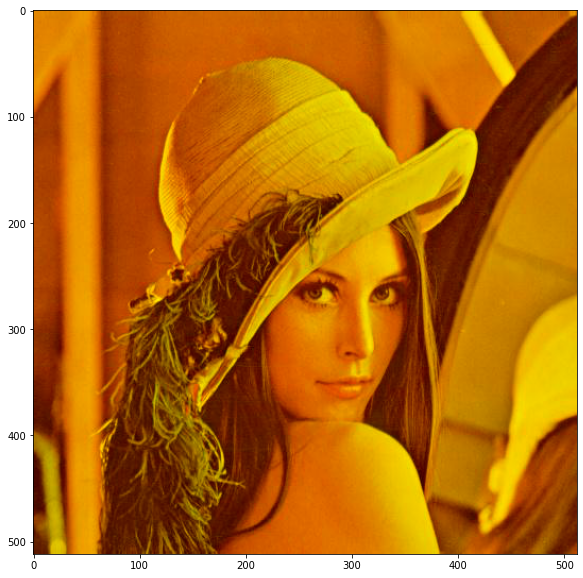

In [56]:
blue_lenna = Image.open('lenna.jpg')
blue_array = np.array(blue_lenna)
blue_array[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(blue_array)
plt.show()

Hecho con ❤ gracias al curso de *Computer Vision and Image Processing Fundamentals* en edX